## Signals

In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import numpy as np
from matplotlib.dates import date2num
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

def clean_date(date_str):
    try:
        if isinstance(date_str, str):
            # Handle format: "9/30/2024 9:37:32 AM"
            if ' ' in date_str:
                date_part = date_str.split()[0]
                if '/' in date_part:
                    return datetime.strptime(date_part, '%m/%d/%Y').strftime('%Y-%m-%d')
                else:
                    return datetime.strptime(date_part, '%Y-%m-%d').strftime('%Y-%m-%d')
            # Handle format: "01/01/14"
            elif '/' in date_str:
                return datetime.strptime(date_str, '%m/%d/%y').strftime('%Y-%m-%d')
            # Handle format: "YYYY-MM-DD"
            else:
                return date_str
        return None
    except Exception as e:
        print(f"Error cleaning date {date_str}: {str(e)}")
        return None

def create_sentiment_price_plot(sector, etf, sentiment_df, price_df, merged_df):
    # Create a figure with secondary y-axis
    fig = make_subplots(rows=2, cols=1, 
                       subplot_titles=(f'{sector} Sector Price and Sentiment', 
                                     f'{sector} Sector Price Changes vs Sentiment'))
    
    # Add price line
    fig.add_trace(
        go.Scatter(x=merged_df['date'], y=merged_df['close'],
                  name='Price', line=dict(color='blue')),
        row=1, col=1
    )
    
    # Add sentiment line
    fig.add_trace(
        go.Scatter(x=merged_df['date'], y=merged_df['avg_sentiment'],
                  name='Sentiment', line=dict(color='red')),
        row=1, col=1
    )
    
    # Convert dates to numeric values for color mapping
    dates = pd.to_datetime(merged_df['date'])
    date_nums = (dates - dates.min()).dt.total_seconds()
    
    # Add scatter plot of price changes vs sentiment
    fig.add_trace(
        go.Scatter(x=merged_df['avg_sentiment'], y=merged_df['price_change'],
                  mode='markers', name='Price Change vs Sentiment',
                  marker=dict(color=date_nums,
                            colorscale='Viridis',
                            showscale=True,
                            colorbar=dict(title='Time (seconds from start)'))),
        row=2, col=1
    )
    
    # Update layout
    fig.update_layout(
        height=800,
        showlegend=True,
        title_text=f"{sector} Sector Analysis ({etf.strip()})",
        title_x=0.5
    )
    
    # Update axes labels
    fig.update_xaxes(title_text="Date", row=1, col=1)
    fig.update_xaxes(title_text="Sentiment Score", row=2, col=1)
    fig.update_yaxes(title_text="Price", row=1, col=1)
    fig.update_yaxes(title_text="Price Change (%)", row=2, col=1)
    
    return fig

def create_sentiment_distribution_plot(sector, merged_df):
    # Create a figure for sentiment distribution
    fig = go.Figure()
    
    # Add histogram of sentiment scores
    fig.add_trace(
        go.Histogram(x=merged_df['avg_sentiment'],
                    name='Sentiment Distribution',
                    nbinsx=30)
    )
    
    # Add vertical lines for sentiment thresholds
    thresholds = {
        'Strong Buy': 0.95,
        'Buy': 0.85,
        'Neutral': 0.75,
        'Sell': 0.65,
        'Strong Sell': 0.55
    }
    
    colors = {
        'Strong Buy': 'darkgreen',
        'Buy': 'lightgreen',
        'Neutral': 'gray',
        'Sell': 'pink',
        'Strong Sell': 'red'
    }
    
    for signal, threshold in thresholds.items():
        fig.add_vline(x=threshold, line_dash="dash", line_color=colors[signal],
                     annotation_text=signal, annotation_position="top right")
    
    # Update layout
    fig.update_layout(
        title=f"{sector} Sector Sentiment Distribution",
        xaxis_title="Sentiment Score",
        yaxis_title="Count",
        showlegend=True
    )
    
    return fig

try:
    # Connect to the database
    conn = sqlite3.connect("DB/new_etfs.db")
    
    # Define sectors and their main ETFs
    sectors = {
        'Technology': ' XLK ',
        'Healthcare': ' XLV ',
        'Real Estate': ' VNQ ',
        'Financials': ' XLF ',
        'Energy': ' XLE '
    }
    
    for sector, etf in sectors.items():
        print(f"\nProcessing {sector} sector...")
        
        # Get sentiment data
        sentiment_query = f"""
        SELECT 
            publication_date,
            AVG(sentiment_score) as avg_sentiment,
            COUNT(*) as article_count
        FROM articles 
        WHERE sector = '{sector}'
        AND sentiment_score IS NOT NULL
        GROUP BY publication_date
        ORDER BY publication_date
        """
        
        sentiment_df = pd.read_sql_query(sentiment_query, conn)
        sentiment_df['date'] = sentiment_df['publication_date'].apply(clean_date)
        sentiment_df = sentiment_df.dropna(subset=['date'])
        
        # Get price data
        price_query = f"""
        SELECT 
            date,
            close,
            volume
        FROM etf_prices
        WHERE ticker = '{etf}'
        ORDER BY date
        """
        
        price_df = pd.read_sql_query(price_query, conn)
        price_df['date'] = price_df['date'].apply(clean_date)
        price_df = price_df.dropna(subset=['date'])
        
        # Merge sentiment and price data
        merged_df = pd.merge(sentiment_df, price_df, on='date', how='inner')
        
        if len(merged_df) == 0:
            print(f"Warning: No matching data found for {sector} sector")
            continue
        
        # Calculate price changes
        merged_df['price_change'] = merged_df['close'].pct_change()
        
        # Create and display price vs sentiment plot
        print(f"\nDisplaying Price and Sentiment Analysis for {sector} Sector:")
        fig1 = create_sentiment_price_plot(sector, etf, sentiment_df, price_df, merged_df)
        display(fig1)
        
        # Create and display sentiment distribution plot
        print(f"\nDisplaying Sentiment Distribution for {sector} Sector:")
        fig2 = create_sentiment_distribution_plot(sector, merged_df)
        display(fig2)
        
        # Calculate correlation
        correlation = merged_df['avg_sentiment'].corr(merged_df['close'])
        print(f"\nCorrelation between sentiment and price for {sector}: {correlation:.3f}")
        
        # Calculate signal accuracy
        merged_df['next_day_return'] = merged_df['price_change'].shift(-1)
        signal_accuracy = {}
        
        thresholds = {
            'Strong Buy': 0.95,
            'Buy': 0.85,
            'Neutral': 0.75,
            'Sell': 0.65,
            'Strong Sell': 0.55
        }
        
        for signal, threshold in thresholds.items():
            mask = merged_df['avg_sentiment'] >= threshold
            if mask.any():
                avg_return = merged_df.loc[mask, 'next_day_return'].mean()
                signal_accuracy[signal] = avg_return
        
        print("\nSignal Accuracy:")
        for signal, accuracy in signal_accuracy.items():
            print(f"{signal}: {accuracy:.2%}")
        
        print("\n" + "="*80 + "\n")

except sqlite3.Error as e:
    print(f"An error occurred: {e}")

finally:
    if 'conn' in locals():
        conn.close()
        print("\nDatabase connection closed.")


Processing Technology sector...

Displaying Price and Sentiment Analysis for Technology Sector:



Displaying Sentiment Distribution for Technology Sector:



Correlation between sentiment and price for Technology: -0.006

Signal Accuracy:
Strong Buy: 0.07%
Buy: 0.06%
Neutral: 0.06%
Sell: 0.05%
Strong Sell: 0.05%



Processing Healthcare sector...

Displaying Price and Sentiment Analysis for Healthcare Sector:



Displaying Sentiment Distribution for Healthcare Sector:



Correlation between sentiment and price for Healthcare: -0.019

Signal Accuracy:
Strong Buy: 0.07%
Buy: 0.02%
Neutral: 0.03%
Sell: 0.03%
Strong Sell: 0.02%



Processing Real Estate sector...

Displaying Price and Sentiment Analysis for Real Estate Sector:



Displaying Sentiment Distribution for Real Estate Sector:



Correlation between sentiment and price for Real Estate: -0.194

Signal Accuracy:
Strong Buy: -1.99%
Buy: 0.06%
Neutral: 0.05%
Sell: 0.23%
Strong Sell: 0.22%



Processing Financials sector...

Displaying Price and Sentiment Analysis for Financials Sector:



Displaying Sentiment Distribution for Financials Sector:



Correlation between sentiment and price for Financials: 0.042

Signal Accuracy:
Strong Buy: -0.01%
Buy: 0.03%
Neutral: 0.04%
Sell: 0.04%
Strong Sell: 0.04%



Processing Energy sector...

Displaying Price and Sentiment Analysis for Energy Sector:



Displaying Sentiment Distribution for Energy Sector:



Correlation between sentiment and price for Energy: -0.001

Signal Accuracy:
Strong Buy: 0.17%
Buy: 0.02%
Neutral: -0.00%
Sell: 0.01%
Strong Sell: 0.03%



Database connection closed.


## Comparing differnt sentimental based algos 

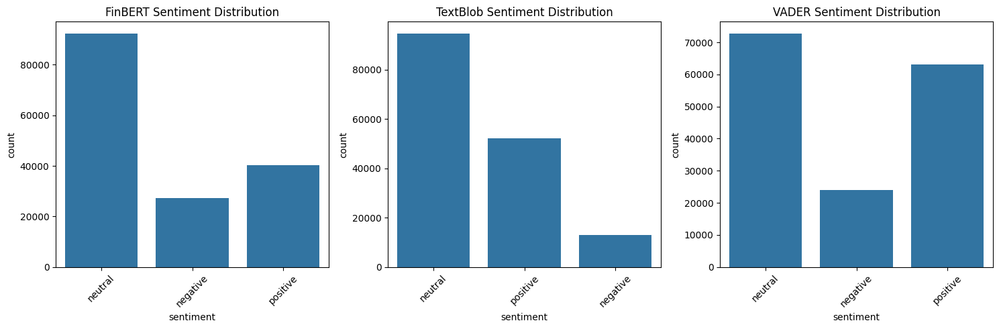

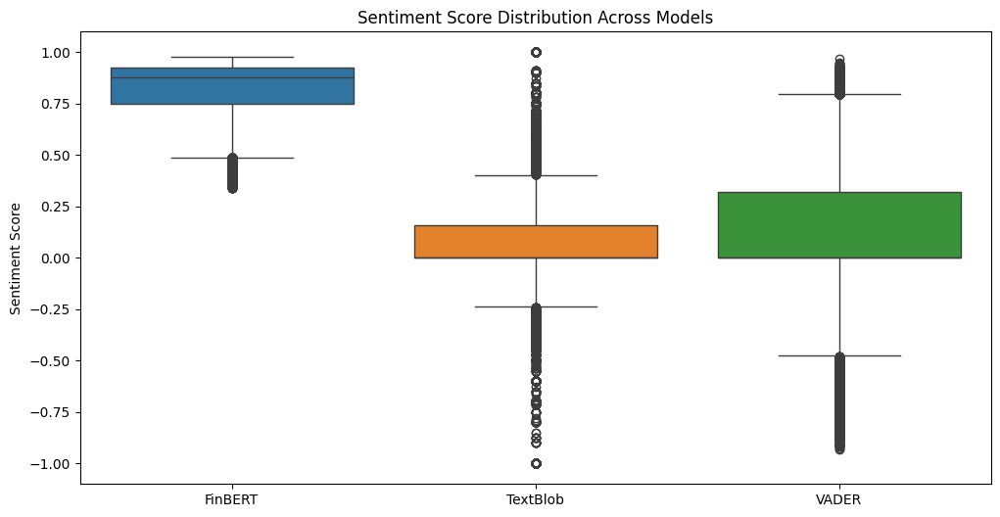

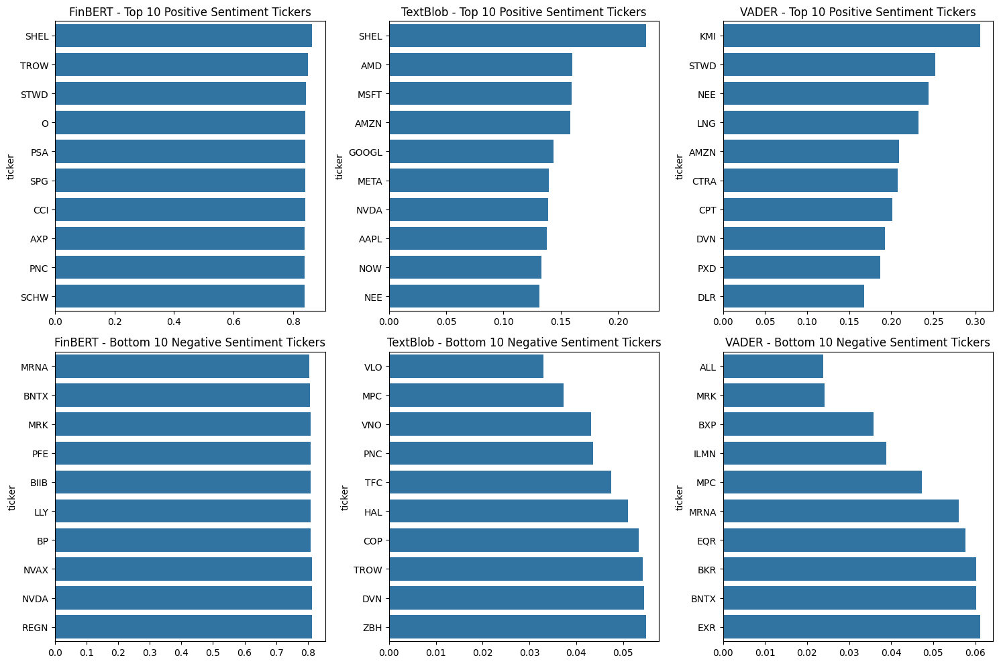

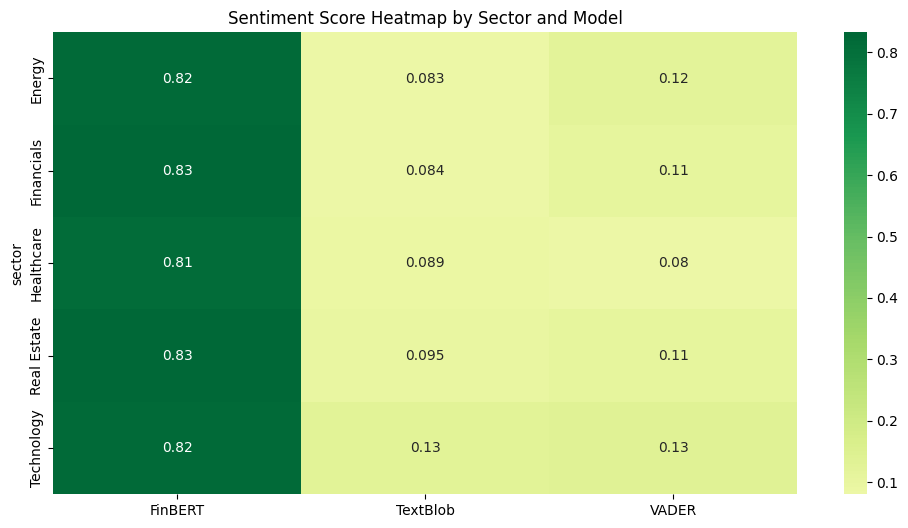

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime

# Read the sentiment analysis results
finbert = pd.read_csv("Trained_models/Combined_Finbert.csv")
textblob = pd.read_csv("Trained_models/textblobop.csv")
vader = pd.read_csv("Trained_models/Vader_s Output.csv")

# Convert publication_date to datetime
for df in [finbert, textblob, vader]:
    df['publication_date'] = pd.to_datetime(df['publication_date'])

# 1. Sentiment Distribution Comparison
def plot_sentiment_distribution():
    plt.figure(figsize=(15, 5))
    
    # Create subplots for each model
    for idx, (model, df) in enumerate([('FinBERT', finbert), ('TextBlob', textblob), ('VADER', vader)]):
        plt.subplot(1, 3, idx + 1)
        sns.countplot(data=df, x='sentiment')
        plt.title(f'{model} Sentiment Distribution')
        plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()

# 2. Sentiment Score Comparison Box Plot
def plot_sentiment_score_comparison():
    plt.figure(figsize=(12, 6))
    
    # Combine sentiment scores from all models
    comparison_data = pd.DataFrame({
        'FinBERT': finbert['sentiment_score'],
        'TextBlob': textblob['sentiment_score'],
        'VADER': vader['sentiment_score']
    })
    
    sns.boxplot(data=comparison_data)
    plt.title('Sentiment Score Distribution Across Models')
    plt.ylabel('Sentiment Score')
    plt.show()

# 3. Sector-wise Sentiment Analysis
def plot_sector_sentiment():
    # Create a figure with subplots for each model
    fig = make_subplots(rows=1, cols=3, subplot_titles=('FinBERT', 'TextBlob', 'VADER'))
    
    for idx, (model, df) in enumerate([('FinBERT', finbert), ('TextBlob', textblob), ('VADER', vader)]):
        sector_sentiment = df.groupby('sector')['sentiment_score'].mean().reset_index()
        fig.add_trace(
            go.Bar(x=sector_sentiment['sector'], y=sector_sentiment['sentiment_score']),
            row=1, col=idx+1
        )
    
    fig.update_layout(height=600, title_text="Average Sentiment Score by Sector")
    fig.show()

# 4. Time Series Analysis of Sentiment
def plot_sentiment_time_series():
    # Create a figure with subplots for each model
    fig = make_subplots(rows=3, cols=1, subplot_titles=('FinBERT', 'TextBlob', 'VADER'))
    
    for idx, (model, df) in enumerate([('FinBERT', finbert), ('TextBlob', textblob), ('VADER', vader)]):
        daily_sentiment = df.groupby('publication_date')['sentiment_score'].mean().reset_index()
        fig.add_trace(
            go.Scatter(x=daily_sentiment['publication_date'], y=daily_sentiment['sentiment_score']),
            row=idx+1, col=1
        )
    
    fig.update_layout(height=900, title_text="Sentiment Score Over Time")
    fig.show()

# 5. Top/Bottom Sentiment Tickers
def plot_top_bottom_tickers():
    plt.figure(figsize=(15, 10))
    
    for idx, (model, df) in enumerate([('FinBERT', finbert), ('TextBlob', textblob), ('VADER', vader)]):
        # Top 10 positive sentiment tickers
        plt.subplot(2, 3, idx + 1)
        top_tickers = df.groupby('ticker')['sentiment_score'].mean().nlargest(10)
        sns.barplot(x=top_tickers.values, y=top_tickers.index)
        plt.title(f'{model} - Top 10 Positive Sentiment Tickers')
        
        # Bottom 10 negative sentiment tickers
        plt.subplot(2, 3, idx + 4)
        bottom_tickers = df.groupby('ticker')['sentiment_score'].mean().nsmallest(10)
        sns.barplot(x=bottom_tickers.values, y=bottom_tickers.index)
        plt.title(f'{model} - Bottom 10 Negative Sentiment Tickers')
    
    plt.tight_layout()
    plt.show()

# 6. Sentiment Heatmap by Sector and Model
def plot_sentiment_heatmap():
    # Create a combined dataframe for heatmap
    heatmap_data = pd.DataFrame()
    
    for model, df in [('FinBERT', finbert), ('TextBlob', textblob), ('VADER', vader)]:
        sector_sentiment = df.groupby('sector')['sentiment_score'].mean()
        heatmap_data[model] = sector_sentiment
    
    plt.figure(figsize=(12, 6))
    sns.heatmap(heatmap_data, annot=True, cmap='RdYlGn', center=0)
    plt.title('Sentiment Score Heatmap by Sector and Model')
    plt.show()

# Generate all visualizations
if __name__ == "__main__":
    plot_sentiment_distribution()
    plot_sentiment_score_comparison()
    plot_sector_sentiment()
    plot_sentiment_time_series()
    plot_top_bottom_tickers()
    plot_sentiment_heatmap()

In [ ]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Connect to SQLite database
conn = sqlite3.connect('/Users/nilaysinghsolanki/Downloads/project_etfs.db')

# Query data
query = """
SELECT ticker, sentiment, COUNT(*) AS sentiment_count
FROM articles
WHERE sector = 'Financials'
GROUP BY ticker, sentiment;
"""
df = pd.read_sql_query(query, conn)
conn.close()

# Pivot data for grouped bar chart
pivot_df = df.pivot(index='ticker', columns='sentiment', values='sentiment_count').fillna(0)

# Plot grouped bar chart
pivot_df.plot(kind='bar', figsize=(12, 6))
plt.title('Sentiment Counts by Ticker in Financials')
plt.xlabel('Ticker')
plt.ylabel('Count')
plt.legend(title='Sentiment')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('/Users/nilaysinghsolanki/Downloads/project_etfs.db')  # Replace 'database.db' with your actual database file path

# Query to get positive sentiment counts by sector
query = """
SELECT sector, COUNT(*) AS positive_count
FROM articles
WHERE sentiment = 'positive'
GROUP BY sector
ORDER BY positive_count DESC;
"""

# Execute the query and load results into a Pandas DataFrame
df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Generate a pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    df['positive_count'], 
    labels=df['sector'], 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF9966']
)
plt.title('Positive Sentiment Distribution by Sector')
plt.show()


In [ ]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt

# Connect to the SQLite database
conn = sqlite3.connect('/Users/nilaysinghsolanki/Downloads/project_etfs.db')  # Replace 'database.db' with your actual database file path

# Query to get positive sentiment counts by sector
query = """
SELECT sector, COUNT(*) AS positive_count
FROM articles
WHERE sentiment = 'neutral'
GROUP BY sector
ORDER BY positive_count DESC;
"""

# Execute the query and load results into a Pandas DataFrame
df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Generate a pie chart
plt.figure(figsize=(8, 8))
plt.pie(
    df['positive_count'], 
    labels=df['sector'], 
    autopct='%1.1f%%', 
    startangle=90, 
    colors=['#FF9999', '#66B2FF', '#99FF99', '#FFCC99', '#FF9966']
)
plt.title('Neutral Sentiment Distribution by Sector')
plt.show()


In [ ]:
import pandas as pd

# Load the CSV file
df = pd.read_csv('/Users/nilaysinghsolanki/Downloads/part-9.csv')

# Convert 'publication_date' to datetime automatically handling mixed formats
df['publication_date'] = pd.to_datetime(df['publication_date'], errors='coerce').dt.date

# Save the cleaned CSV file
df.to_csv('/Users/nilaysinghsolanki/Downloads/part-9_cleaned.csv', index=False)




## Sentimental Analysis 
### Finbert 

In [ ]:
import pandas as pd
# from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

# Use a pipeline as a high-level helper
from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification

from transformers import pipeline, AutoTokenizer, AutoModelForSequenceClassification
import torch
import pandas as pd

# Define the FinBERT pipeline method
def pipelineMethod(payload):
    # Load the FinBERT tokenizer and model
    tokenizer = AutoTokenizer.from_pretrained("ProsusAI/finbert")
    model = AutoModelForSequenceClassification.from_pretrained("ProsusAI/finbert")

    # Check if a GPU is available and move the model to GPU (if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # Set up the Hugging Face pipeline
    classifier = pipeline(
        "text-classification",
        model=model,
        tokenizer=tokenizer,
        device=0 if torch.cuda.is_available() else -1  # Device 0: GPU, -1: CPU
    )

    # Perform classification on the input payload (text data)
    result = classifier(payload)
    return result

# Load scraped data from the CSV file
csv_file_path = '/Users/nilaysinghsolanki/Downloads/articles_part_15.csv'  # Google Colab path for your file
data = pd.read_csv(csv_file_path)

# Add new columns for sentiment analysis
data['top_sentiment'] = ''
data['sentiment_score'] = 0.0

# Apply sentiment analysis to the title column
counter = 0
for index, row in data.iterrows():
    title = row['title']  # Assuming 'title' is the column with article titles
    output = pipelineMethod(title)  # Call the pipeline method to get sentiment
    data.at[index, 'top_sentiment'] = output[0]['label']      # Sentiment label (e.g., 'positive', 'negative', 'neutral')
    data.at[index, 'sentiment_score'] = output[0]['score']    # Confidence score for the sentiment
    counter += 1
    print(f"Processed row {counter}: {title}")

# Save the updated data back to a new CSV file
output_csv_file_path = '/Users/nilaysinghsolanki/Downloads/part-15.csv'  # change name
data.to_csv(output_csv_file_path, index=False)

print(f"Sentiment analysis completed for {counter} rows.")
print("New data with sentiment saved to:", output_csv_file_path)

### Vader 

In [ ]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer
import nltk

# Download VADER lexicon (only needed once)
nltk.download('vader_lexicon')

# Load VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Read your existing CSV file (if needed)
# df = pd.read_csv("your_input_file.csv")

# Apply sentiment analysis to the 'title' column
def get_sentiment(text):
    sentiment_score = sia.polarity_scores(str(text))['compound']  # Get compound score
    sentiment = "positive" if sentiment_score > 0.05 else "negative" if sentiment_score < -0.05 else "neutral"
    return sentiment, sentiment_score

# Apply function to the dataframe
df[['sentiment', 'sentiment_score']] = df['title'].apply(lambda x: pd.Series(get_sentiment(x)))

# Save to a new CSV file
df.to_csv("updated_sentiment_data.csv", index=False)

print("Sentiment analysis completed and saved to 'updated_sentiment_data.csv' ✅")


### Textblobop 

In [ ]:
import pandas as pd
from textblob import TextBlob

# Function to get sentiment using TextBlob
def get_textblob_sentiment(text):
    analysis = TextBlob(str(text))  # Convert to string to avoid NaN issues
    sentiment_score = analysis.sentiment.polarity  # Score between -1 and 1
    sentiment = "positive" if sentiment_score > 0 else "negative" if sentiment_score < 0 else "neutral"
    return sentiment, sentiment_score

# Apply sentiment analysis to the 'title' column
df[['sentiment', 'sentiment_score']] = df['title'].apply(lambda x: pd.Series(get_textblob_sentiment(x)))

# Save the updated dataframe to a new CSV file
df.to_csv("textblobop.csv", index=False)

print("✅ Sentiment analysis completed and saved to 'textblobop.csv'")


In [2]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import numpy as np
from matplotlib.dates import date2num
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display

def clean_date(date_str):
    try:
        if isinstance(date_str, str):
            # Handle format: "9/30/2024 9:37:32 AM"
            if ' ' in date_str:
                date_part = date_str.split()[0]
                if '/' in date_part:
                    return datetime.strptime(date_part, '%m/%d/%Y').strftime('%Y-%m-%d')
                else:
                    return datetime.strptime(date_part, '%Y-%m-%d').strftime('%Y-%m-%d')
            # Handle format: "01/01/14"
            elif '/' in date_str:
                return datetime.strptime(date_str, '%m/%d/%y').strftime('%Y-%m-%d')
            # Handle format: "YYYY-MM-DD"
            else:
                return date_str
        return None
    except Exception as e:
        print(f"Error cleaning date {date_str}: {str(e)}")
        return None

def create_sentiment_price_plot(sector, etf, sentiment_df, price_df, merged_df):
    # Create a figure with secondary y-axis
    fig = make_subplots(rows=2, cols=1, 
                       subplot_titles=(f'{sector} Sector Price and Sentiment', 
                                     f'{sector} Sector Price Changes by Sentiment'))
    
    # Add price line
    fig.add_trace(
        go.Scatter(x=merged_df['date'], y=merged_df['close'],
                  name='Price', line=dict(color='blue')),
        row=1, col=1
    )
    
    # Add sentiment distribution
    sentiment_counts = merged_df.groupby('date')['sentiment'].value_counts(normalize=True).unstack()
    
    # Add stacked area chart for sentiment distribution
    colors = {'positive': 'green', 'neutral': 'gray', 'negative': 'red'}
    for sentiment in ['positive', 'neutral', 'negative']:
        if sentiment in sentiment_counts.columns:
            fig.add_trace(
                go.Scatter(x=sentiment_counts.index, y=sentiment_counts[sentiment],
                          name=f'{sentiment.capitalize()} Sentiment',
                          stackgroup='one',
                          line=dict(color=colors[sentiment])),
                row=1, col=1
            )
    
    # Add box plot for price changes by sentiment
    fig.add_trace(
        go.Box(x=merged_df['sentiment'], y=merged_df['price_change'],
               name='Price Changes by Sentiment',
               boxpoints='all',
               jitter=0.3,
               pointpos=-1.8),
        row=2, col=1
    )
    
    # Update layout
    fig.update_layout(
        height=800,
        showlegend=True,
        title_text=f"{sector} Sector Analysis ({etf.strip()})",
        title_x=0.5
    )
    
    # Update axes labels
    fig.update_xaxes(title_text="Date", row=1, col=1)
    fig.update_xaxes(title_text="Sentiment", row=2, col=1)
    fig.update_yaxes(title_text="Price", row=1, col=1)
    fig.update_yaxes(title_text="Price Change (%)", row=2, col=1)
    
    return fig

def create_sentiment_distribution_plot(sector, merged_df):
    # Create a figure for sentiment distribution
    fig = go.Figure()
    
    # Add pie chart of sentiment distribution
    sentiment_counts = merged_df['sentiment'].value_counts()
    fig.add_trace(
        go.Pie(labels=sentiment_counts.index,
               values=sentiment_counts.values,
               hole=.3)
    )
    
    # Update layout
    fig.update_layout(
        title=f"{sector} Sector Sentiment Distribution",
        showlegend=True
    )
    
    return fig

def generate_trading_signals(merged_df):
    # Calculate next day's returns
    merged_df['next_day_return'] = merged_df['price_change'].shift(-1)
    signal_accuracy = {}
    signal_counts = {}
    
    # Group by sentiment and calculate average returns
    for sentiment in ['positive', 'neutral', 'negative']:
        mask = merged_df['sentiment'] == sentiment
        if mask.any():
            avg_return = merged_df.loc[mask, 'next_day_return'].mean()
            signal_accuracy[sentiment.capitalize()] = avg_return
            signal_counts[sentiment.capitalize()] = mask.sum()
    
    return signal_accuracy, signal_counts

try:
    # Connect to the database
    conn = sqlite3.connect("DB/new_etfs.db")
    
    # Define sectors and their main ETFs
    sectors = {
        'Technology': ' XLK ',
        'Healthcare': ' XLV ',
        'Real Estate': ' VNQ ',
        'Financials': ' XLF ',
        'Energy': ' XLE '
    }
    
    for sector, etf in sectors.items():
        print(f"\nProcessing {sector} sector...")
        
        # Get sentiment data
        sentiment_query = f"""
        SELECT 
            publication_date,
            sentiment,
            COUNT(*) as article_count
        FROM articles 
        WHERE sector = '{sector}'
        AND sentiment IS NOT NULL
        GROUP BY publication_date, sentiment
        ORDER BY publication_date
        """
        
        sentiment_df = pd.read_sql_query(sentiment_query, conn)
        sentiment_df['date'] = sentiment_df['publication_date'].apply(clean_date)
        sentiment_df = sentiment_df.dropna(subset=['date'])
        
        # Get price data
        price_query = f"""
        SELECT 
            date,
            close,
            volume
        FROM etf_prices
        WHERE ticker = '{etf}'
        ORDER BY date
        """
        
        price_df = pd.read_sql_query(price_query, conn)
        price_df['date'] = price_df['date'].apply(clean_date)
        price_df = price_df.dropna(subset=['date'])
        
        # Merge sentiment and price data
        merged_df = pd.merge(sentiment_df, price_df, on='date', how='inner')
        
        if len(merged_df) == 0:
            print(f"Warning: No matching data found for {sector} sector")
            continue
        
        # Calculate price changes
        merged_df['price_change'] = merged_df['close'].pct_change()
        
        # Create and display price vs sentiment plot
        print(f"\nDisplaying Price and Sentiment Analysis for {sector} Sector:")
        fig1 = create_sentiment_price_plot(sector, etf, sentiment_df, price_df, merged_df)
        display(fig1)
        
        # Create and display sentiment distribution plot
        print(f"\nDisplaying Sentiment Distribution for {sector} Sector:")
        fig2 = create_sentiment_distribution_plot(sector, merged_df)
        display(fig2)
        
        # Generate trading signals and get accuracy
        signal_accuracy, signal_counts = generate_trading_signals(merged_df)
        
        print("\nSignal Analysis:")
        print("Sentiment\tCount\t\tAverage Return")
        print("-" * 50)
        for sentiment in signal_accuracy.keys():
            print(f"{sentiment:<15} {signal_counts[sentiment]:<15} {signal_accuracy[sentiment]:.2%}")
        
        print("\n" + "="*80 + "\n")

except sqlite3.Error as e:
    print(f"An error occurred: {e}")

finally:
    if 'conn' in locals():
        conn.close()
        print("\nDatabase connection closed.")


Processing Technology sector...

Displaying Price and Sentiment Analysis for Technology Sector:



Displaying Sentiment Distribution for Technology Sector:



Signal Analysis:
Sentiment	Count		Average Return
--------------------------------------------------
Positive        645             0.03%
Neutral         1835            0.05%
Negative        550             0.07%



Processing Healthcare sector...

Displaying Price and Sentiment Analysis for Healthcare Sector:



Displaying Sentiment Distribution for Healthcare Sector:



Signal Analysis:
Sentiment	Count		Average Return
--------------------------------------------------
Positive        1380            0.02%
Neutral         2245            0.02%
Negative        565             0.01%



Processing Real Estate sector...

Displaying Price and Sentiment Analysis for Real Estate Sector:



Displaying Sentiment Distribution for Real Estate Sector:



Signal Analysis:
Sentiment	Count		Average Return
--------------------------------------------------
Positive        55              -0.43%
Neutral         470             0.31%
Negative        135             -0.07%



Processing Financials sector...

Displaying Price and Sentiment Analysis for Financials Sector:



Displaying Sentiment Distribution for Financials Sector:



Signal Analysis:
Sentiment	Count		Average Return
--------------------------------------------------
Positive        450             0.19%
Neutral         1850            0.03%
Negative        570             -0.03%



Processing Energy sector...

Displaying Price and Sentiment Analysis for Energy Sector:



Displaying Sentiment Distribution for Energy Sector:



Signal Analysis:
Sentiment	Count		Average Return
--------------------------------------------------
Positive        635             0.09%
Neutral         1510            0.02%
Negative        585             0.03%



Database connection closed.
